# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [56]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

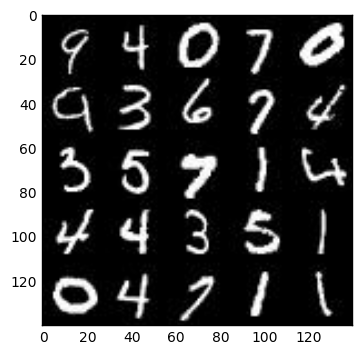

In [57]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

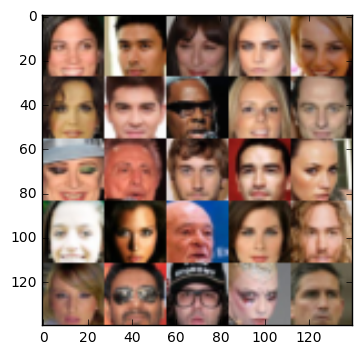

In [58]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [59]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [60]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_images = tf.placeholder(tf.float32,[None, image_width, image_height, image_channels],name='input_images')
    input_z = tf.placeholder(tf.float32,[None,z_dim],name = 'input_z')
    learning_rate = tf.placeholder(tf.float32,name = "learing_rate")
    return input_images, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [61]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        C1 = tf.layers.conv2d(images,64,3,strides=2, padding='same')
        M1 = tf.maximum(alpha*C1,C1)
        
        C2 = tf.layers.conv2d(M1,128,3,strides=2,padding='same')
        B2 = tf.layers.batch_normalization(C2, training=True)
        M2 = tf.maximum(alpha*B2,B2)
        
        C3 = tf.layers.conv2d(M2,256,3,strides=2,padding='same')
        B3 = tf.layers.batch_normalization(C3, training=True)
        M3 = tf.maximum(alpha*B3,B3)
#         print(M3.shape)
        flat = tf.reshape(M3, (-1, 4*4*256))
        
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)
    return out, logits



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [62]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function 
#     print(z)
    with tf.variable_scope('generator',reuse=(not is_train)):
        alpha = 0.2
        x1 = tf.layers.dense(z,7*7*256)
        x1 = tf.reshape(x1, (-1,7,7,256))
        x1 = tf.layers.batch_normalization(x1,training=is_train)

        C1 = tf.layers.conv2d_transpose(x1,128,3,strides=2,padding='same')
        B1 = tf.layers.batch_normalization(C1,training=is_train)
        M1 = tf.maximum(alpha*B1,B1)

        C2 = tf.layers.conv2d_transpose(M1,64,3,strides=2,padding='same')
        B2 = tf.layers.batch_normalization(C2,training=is_train)
        M2 = tf.maximum(alpha*B2,B2)
        
        logits = tf.layers.conv2d_transpose(M2,out_channel_dim,3,strides=1,padding='same')
        output = tf.tanh(logits)
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [63]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    al = 0.1
    g_out = generator(input_z, out_channel_dim, is_train=True)
    d_out_real,d_logits_real = discriminator(input_real, reuse=False)
    dg_out,dg_logits = discriminator(g_out, reuse=True)
    
    dg_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dg_logits,labels=tf.ones_like(dg_out)))
    
    dr_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,labels=tf.ones_like(d_out_real)*(1-al)))
    d_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=dg_logits,labels=tf.zeros_like(dg_out)))
    d_loss = dr_loss+d_loss
    return d_loss, dg_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [64]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_var = tf.trainable_variables()
    dgr = [var for var in t_var if var.name.startswith('discriminator')]
    gen = [var for var in t_var if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_opt_train = tf.train.AdamOptimizer(beta1=beta1,learning_rate=learning_rate).minimize(d_loss,var_list=dgr)
        g_opt_train = tf.train.AdamOptimizer(beta1=beta1,learning_rate=learning_rate).minimize(g_loss,var_list=gen)
    return d_opt_train, g_opt_train


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [65]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [66]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_images, input_z, learning_rate1 = model_inputs(data_shape[1],data_shape[2],data_shape[3],z_dim)
    
    d_loss, dg_loss = model_loss(input_images, input_z, data_shape[3])
    
    d_opt_train, dg_opt_train = model_opt(d_loss, dg_loss, learning_rate, beta1)
    

    print_times = 20
    show_times = 200

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        step = 0
        
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):

            
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                feed = {input_images: batch_images, input_z: batch_z, learning_rate1: learning_rate}
                
                sess.run(d_opt_train, feed_dict=feed)  
                sess.run(dg_opt_train, feed_dict=feed)
                
                if step%print_times==0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_images: batch_images*2})
                    train_loss_g = dg_loss.eval({input_z: batch_z})
                    print("step {}, (epoch {}/{})...".format(step, epoch_i+1, epoch_count),
                          "discriminator loss: {:.3f}...".format(train_loss_d),
                          "generator loss: {:.3f}".format(train_loss_g))
                
                    
                if step%show_times==0:
                    show_generator_output(sess, 64, input_z, data_shape[3], data_image_mode)
                step += 1

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

batch_size = 32
z_dim = 100
learning_rate = 0.0003
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

step 0, (epoch 1/2)... discriminator loss: 6.124... generator loss: 0.004


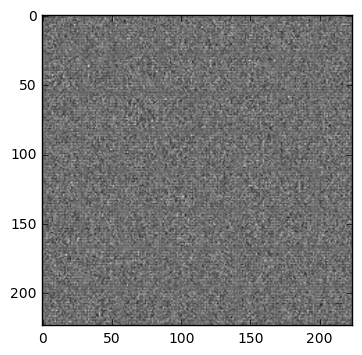

step 20, (epoch 1/2)... discriminator loss: 2.638... generator loss: 0.160
step 40, (epoch 1/2)... discriminator loss: 2.053... generator loss: 0.726
step 60, (epoch 1/2)... discriminator loss: 3.706... generator loss: 1.474
step 80, (epoch 1/2)... discriminator loss: 5.706... generator loss: 2.132
step 100, (epoch 1/2)... discriminator loss: 6.891... generator loss: 2.368
step 120, (epoch 1/2)... discriminator loss: 8.119... generator loss: 2.931
step 140, (epoch 1/2)... discriminator loss: 6.781... generator loss: 2.766
step 160, (epoch 1/2)... discriminator loss: 5.117... generator loss: 0.553
step 180, (epoch 1/2)... discriminator loss: 5.427... generator loss: 0.586
step 200, (epoch 1/2)... discriminator loss: 7.313... generator loss: 3.503


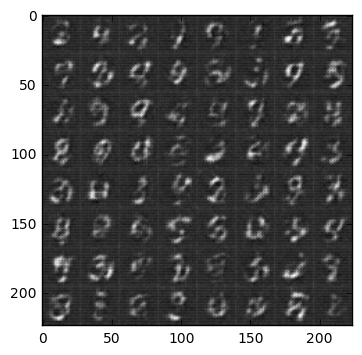

step 220, (epoch 1/2)... discriminator loss: 5.097... generator loss: 0.807
step 240, (epoch 1/2)... discriminator loss: 5.301... generator loss: 1.961
step 260, (epoch 1/2)... discriminator loss: 6.296... generator loss: 2.540
step 280, (epoch 1/2)... discriminator loss: 3.952... generator loss: 1.802
step 300, (epoch 1/2)... discriminator loss: 3.301... generator loss: 1.211
step 320, (epoch 1/2)... discriminator loss: 4.560... generator loss: 1.855
step 340, (epoch 1/2)... discriminator loss: 5.975... generator loss: 3.026
step 360, (epoch 1/2)... discriminator loss: 5.687... generator loss: 2.326
step 380, (epoch 1/2)... discriminator loss: 5.041... generator loss: 1.879
step 400, (epoch 1/2)... discriminator loss: 5.267... generator loss: 1.305


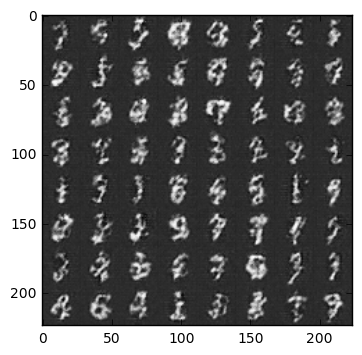

step 420, (epoch 1/2)... discriminator loss: 3.352... generator loss: 2.035
step 440, (epoch 1/2)... discriminator loss: 3.710... generator loss: 2.053
step 460, (epoch 1/2)... discriminator loss: 4.347... generator loss: 1.980
step 480, (epoch 1/2)... discriminator loss: 4.774... generator loss: 2.203
step 500, (epoch 1/2)... discriminator loss: 4.217... generator loss: 1.837
step 520, (epoch 1/2)... discriminator loss: 4.648... generator loss: 2.312
step 540, (epoch 1/2)... discriminator loss: 2.661... generator loss: 3.076
step 560, (epoch 1/2)... discriminator loss: 4.616... generator loss: 1.575
step 580, (epoch 1/2)... discriminator loss: 3.436... generator loss: 1.382
step 600, (epoch 1/2)... discriminator loss: 3.878... generator loss: 3.285


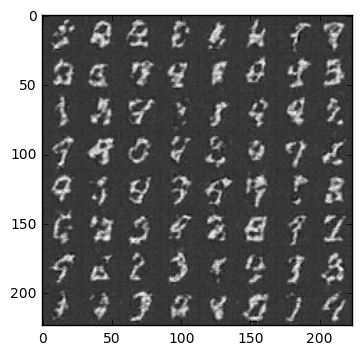

step 620, (epoch 1/2)... discriminator loss: 3.641... generator loss: 3.457
step 640, (epoch 1/2)... discriminator loss: 2.550... generator loss: 3.507
step 660, (epoch 1/2)... discriminator loss: 2.195... generator loss: 1.250
step 680, (epoch 1/2)... discriminator loss: 2.987... generator loss: 2.863
step 700, (epoch 1/2)... discriminator loss: 2.295... generator loss: 2.059
step 720, (epoch 1/2)... discriminator loss: 3.102... generator loss: 5.133
step 740, (epoch 1/2)... discriminator loss: 4.212... generator loss: 2.071
step 760, (epoch 1/2)... discriminator loss: 3.297... generator loss: 3.021
step 780, (epoch 1/2)... discriminator loss: 4.284... generator loss: 2.888
step 800, (epoch 1/2)... discriminator loss: 5.343... generator loss: 2.778


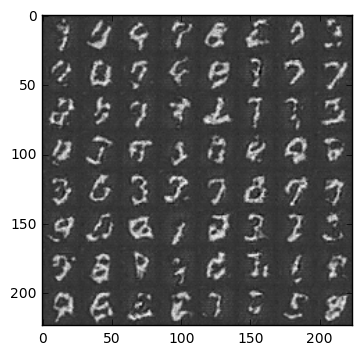

step 820, (epoch 1/2)... discriminator loss: 2.625... generator loss: 5.528
step 840, (epoch 1/2)... discriminator loss: 2.709... generator loss: 1.567
step 860, (epoch 1/2)... discriminator loss: 2.644... generator loss: 3.348
step 880, (epoch 1/2)... discriminator loss: 2.775... generator loss: 1.392
step 900, (epoch 1/2)... discriminator loss: 3.257... generator loss: 2.982
step 920, (epoch 1/2)... discriminator loss: 3.599... generator loss: 2.712
step 940, (epoch 1/2)... discriminator loss: 4.743... generator loss: 0.026
step 960, (epoch 1/2)... discriminator loss: 4.076... generator loss: 1.739
step 980, (epoch 1/2)... discriminator loss: 3.234... generator loss: 1.092
step 1000, (epoch 1/2)... discriminator loss: 2.964... generator loss: 1.549


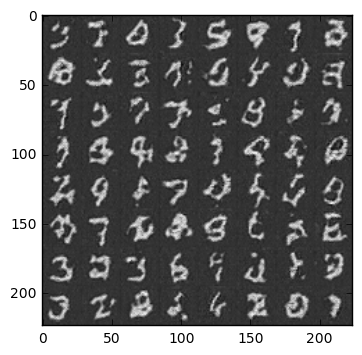

step 1020, (epoch 1/2)... discriminator loss: 3.413... generator loss: 3.360
step 1040, (epoch 1/2)... discriminator loss: 4.151... generator loss: 3.026
step 1060, (epoch 1/2)... discriminator loss: 3.490... generator loss: 0.076
step 1080, (epoch 1/2)... discriminator loss: 1.963... generator loss: 1.839
step 1100, (epoch 1/2)... discriminator loss: 2.441... generator loss: 2.176
step 1120, (epoch 1/2)... discriminator loss: 2.791... generator loss: 1.979
step 1140, (epoch 1/2)... discriminator loss: 2.561... generator loss: 1.982
step 1160, (epoch 1/2)... discriminator loss: 2.565... generator loss: 1.629
step 1180, (epoch 1/2)... discriminator loss: 3.373... generator loss: 2.712
step 1200, (epoch 1/2)... discriminator loss: 2.995... generator loss: 2.048


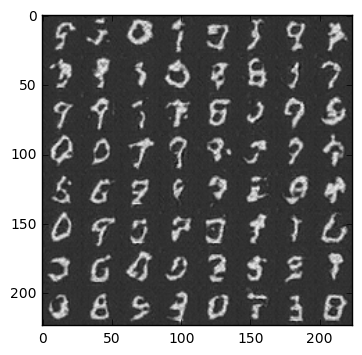

step 1220, (epoch 1/2)... discriminator loss: 2.958... generator loss: 3.327
step 1240, (epoch 1/2)... discriminator loss: 1.555... generator loss: 1.830
step 1260, (epoch 1/2)... discriminator loss: 1.971... generator loss: 3.457
step 1280, (epoch 1/2)... discriminator loss: 2.709... generator loss: 1.484
step 1300, (epoch 1/2)... discriminator loss: 3.021... generator loss: 1.519
step 1320, (epoch 1/2)... discriminator loss: 2.515... generator loss: 1.163
step 1340, (epoch 1/2)... discriminator loss: 1.609... generator loss: 2.522
step 1360, (epoch 1/2)... discriminator loss: 2.174... generator loss: 2.509
step 1380, (epoch 1/2)... discriminator loss: 2.047... generator loss: 3.645
step 1400, (epoch 1/2)... discriminator loss: 1.742... generator loss: 2.608


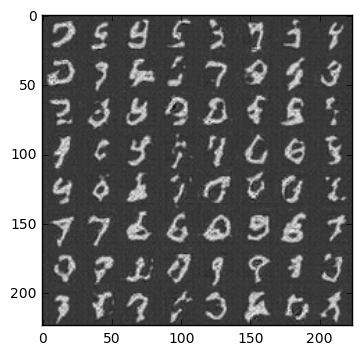

step 1420, (epoch 1/2)... discriminator loss: 0.475... generator loss: 2.934
step 1440, (epoch 1/2)... discriminator loss: 3.040... generator loss: 1.750
step 1460, (epoch 1/2)... discriminator loss: 3.440... generator loss: 3.432
step 1480, (epoch 1/2)... discriminator loss: 4.678... generator loss: 3.269
step 1500, (epoch 1/2)... discriminator loss: 1.003... generator loss: 1.257
step 1520, (epoch 1/2)... discriminator loss: 1.844... generator loss: 1.006
step 1540, (epoch 1/2)... discriminator loss: 2.083... generator loss: 1.742
step 1560, (epoch 1/2)... discriminator loss: 1.997... generator loss: 0.978
step 1580, (epoch 1/2)... discriminator loss: 2.454... generator loss: 3.993
step 1600, (epoch 1/2)... discriminator loss: 2.887... generator loss: 3.023


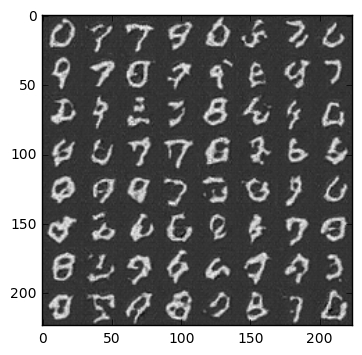

step 1620, (epoch 1/2)... discriminator loss: 3.120... generator loss: 3.769
step 1640, (epoch 1/2)... discriminator loss: 1.716... generator loss: 1.443
step 1660, (epoch 1/2)... discriminator loss: 2.524... generator loss: 2.969
step 1680, (epoch 1/2)... discriminator loss: 3.202... generator loss: 3.427
step 1700, (epoch 1/2)... discriminator loss: 3.585... generator loss: 2.278
step 1720, (epoch 1/2)... discriminator loss: 3.896... generator loss: 3.962
step 1740, (epoch 1/2)... discriminator loss: 1.667... generator loss: 4.227
step 1760, (epoch 1/2)... discriminator loss: 1.532... generator loss: 2.576
step 1780, (epoch 1/2)... discriminator loss: 2.650... generator loss: 3.856
step 1800, (epoch 1/2)... discriminator loss: 2.622... generator loss: 3.111


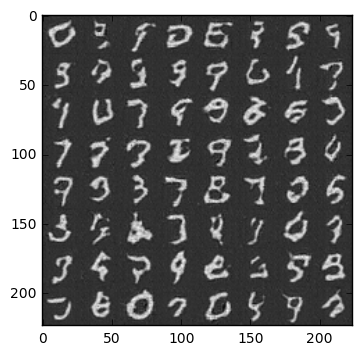

step 1820, (epoch 1/2)... discriminator loss: 2.230... generator loss: 3.991
step 1840, (epoch 1/2)... discriminator loss: 2.704... generator loss: 1.927
step 1860, (epoch 1/2)... discriminator loss: 3.373... generator loss: 3.334
step 1880, (epoch 2/2)... discriminator loss: 3.133... generator loss: 2.320
step 1900, (epoch 2/2)... discriminator loss: 2.214... generator loss: 2.047
step 1920, (epoch 2/2)... discriminator loss: 2.390... generator loss: 2.173
step 1940, (epoch 2/2)... discriminator loss: 3.807... generator loss: 3.588
step 1960, (epoch 2/2)... discriminator loss: 2.955... generator loss: 1.714
step 1980, (epoch 2/2)... discriminator loss: 3.497... generator loss: 3.497
step 2000, (epoch 2/2)... discriminator loss: 2.954... generator loss: 1.915


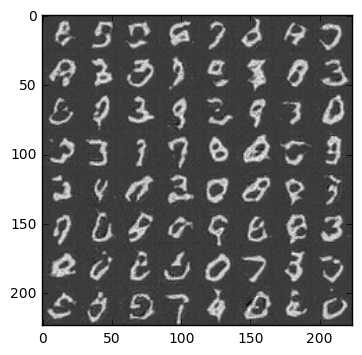

step 2020, (epoch 2/2)... discriminator loss: 1.084... generator loss: 1.359
step 2040, (epoch 2/2)... discriminator loss: 1.121... generator loss: 2.382
step 2060, (epoch 2/2)... discriminator loss: 1.819... generator loss: 2.083
step 2080, (epoch 2/2)... discriminator loss: 1.540... generator loss: 1.960
step 2100, (epoch 2/2)... discriminator loss: 2.422... generator loss: 3.562
step 2120, (epoch 2/2)... discriminator loss: 2.695... generator loss: 4.168
step 2140, (epoch 2/2)... discriminator loss: 2.168... generator loss: 2.788
step 2160, (epoch 2/2)... discriminator loss: 2.148... generator loss: 2.165
step 2180, (epoch 2/2)... discriminator loss: 1.617... generator loss: 1.227
step 2200, (epoch 2/2)... discriminator loss: 3.159... generator loss: 2.974


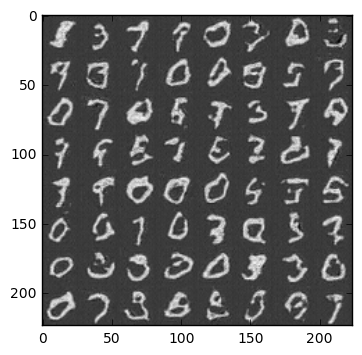

step 2220, (epoch 2/2)... discriminator loss: 3.251... generator loss: 4.157
step 2240, (epoch 2/2)... discriminator loss: 3.142... generator loss: 4.426
step 2260, (epoch 2/2)... discriminator loss: 2.852... generator loss: 2.449
step 2280, (epoch 2/2)... discriminator loss: 4.251... generator loss: 5.650
step 2300, (epoch 2/2)... discriminator loss: 2.108... generator loss: 2.395
step 2320, (epoch 2/2)... discriminator loss: 1.876... generator loss: 3.013
step 2340, (epoch 2/2)... discriminator loss: 3.241... generator loss: 3.055
step 2360, (epoch 2/2)... discriminator loss: 2.760... generator loss: 2.391
step 2380, (epoch 2/2)... discriminator loss: 2.508... generator loss: 2.804
step 2400, (epoch 2/2)... discriminator loss: 2.677... generator loss: 3.149


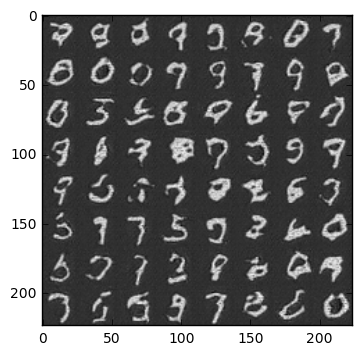

step 2420, (epoch 2/2)... discriminator loss: 1.418... generator loss: 0.569
step 2440, (epoch 2/2)... discriminator loss: 1.039... generator loss: 1.636
step 2460, (epoch 2/2)... discriminator loss: 1.870... generator loss: 2.280
step 2480, (epoch 2/2)... discriminator loss: 2.157... generator loss: 3.112
step 2500, (epoch 2/2)... discriminator loss: 2.061... generator loss: 2.504
step 2520, (epoch 2/2)... discriminator loss: 2.620... generator loss: 2.806
step 2540, (epoch 2/2)... discriminator loss: 3.438... generator loss: 4.454
step 2560, (epoch 2/2)... discriminator loss: 1.028... generator loss: 1.117
step 2580, (epoch 2/2)... discriminator loss: 1.657... generator loss: 1.208
step 2600, (epoch 2/2)... discriminator loss: 2.617... generator loss: 3.169


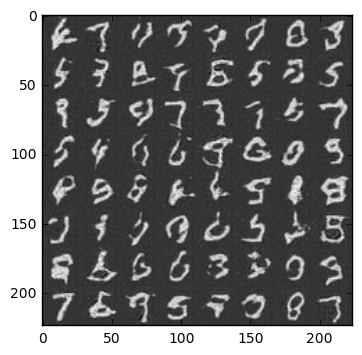

step 2620, (epoch 2/2)... discriminator loss: 2.444... generator loss: 3.108
step 2640, (epoch 2/2)... discriminator loss: 2.637... generator loss: 3.369
step 2660, (epoch 2/2)... discriminator loss: 2.512... generator loss: 2.519
step 2680, (epoch 2/2)... discriminator loss: 2.364... generator loss: 2.736
step 2700, (epoch 2/2)... discriminator loss: 2.983... generator loss: 3.373
step 2720, (epoch 2/2)... discriminator loss: 2.924... generator loss: 3.396
step 2740, (epoch 2/2)... discriminator loss: 0.778... generator loss: 1.814
step 2760, (epoch 2/2)... discriminator loss: 1.975... generator loss: 3.004
step 2780, (epoch 2/2)... discriminator loss: 2.433... generator loss: 2.820
step 2800, (epoch 2/2)... discriminator loss: 1.657... generator loss: 1.013


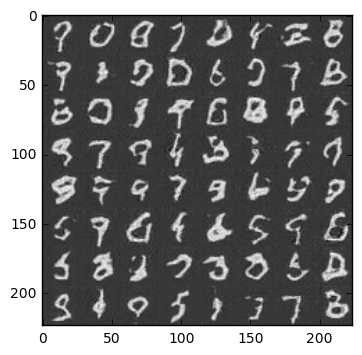

step 2820, (epoch 2/2)... discriminator loss: 2.978... generator loss: 3.626
step 2840, (epoch 2/2)... discriminator loss: 3.290... generator loss: 3.105
step 2860, (epoch 2/2)... discriminator loss: 3.480... generator loss: 3.868
step 2880, (epoch 2/2)... discriminator loss: 2.705... generator loss: 3.947
step 2900, (epoch 2/2)... discriminator loss: 4.026... generator loss: 3.200
step 2920, (epoch 2/2)... discriminator loss: 3.670... generator loss: 3.600
step 2940, (epoch 2/2)... discriminator loss: 2.260... generator loss: 3.471
step 2960, (epoch 2/2)... discriminator loss: 4.170... generator loss: 2.844
step 2980, (epoch 2/2)... discriminator loss: 3.255... generator loss: 3.336
step 3000, (epoch 2/2)... discriminator loss: 1.561... generator loss: 2.822


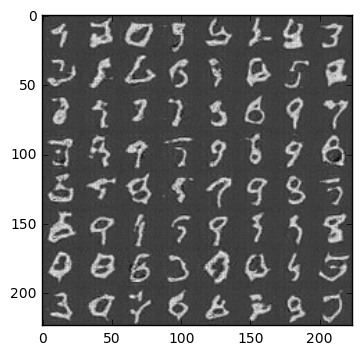

step 3020, (epoch 2/2)... discriminator loss: 2.541... generator loss: 3.735
step 3040, (epoch 2/2)... discriminator loss: 2.642... generator loss: 2.815
step 3060, (epoch 2/2)... discriminator loss: 3.768... generator loss: 3.565
step 3080, (epoch 2/2)... discriminator loss: 2.684... generator loss: 2.432
step 3100, (epoch 2/2)... discriminator loss: 2.438... generator loss: 1.720
step 3120, (epoch 2/2)... discriminator loss: 1.421... generator loss: 2.418
step 3140, (epoch 2/2)... discriminator loss: 3.177... generator loss: 4.133
step 3160, (epoch 2/2)... discriminator loss: 1.684... generator loss: 2.916
step 3180, (epoch 2/2)... discriminator loss: 3.142... generator loss: 3.022
step 3200, (epoch 2/2)... discriminator loss: 2.934... generator loss: 3.443


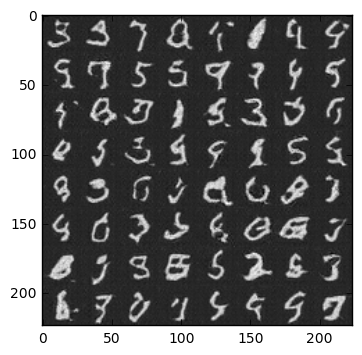

step 3220, (epoch 2/2)... discriminator loss: 2.093... generator loss: 3.084
step 3240, (epoch 2/2)... discriminator loss: 2.596... generator loss: 2.287
step 3260, (epoch 2/2)... discriminator loss: 3.587... generator loss: 4.747
step 3280, (epoch 2/2)... discriminator loss: 4.079... generator loss: 3.808
step 3300, (epoch 2/2)... discriminator loss: 2.543... generator loss: 2.828
step 3320, (epoch 2/2)... discriminator loss: 2.839... generator loss: 2.641
step 3340, (epoch 2/2)... discriminator loss: 2.011... generator loss: 2.198
step 3360, (epoch 2/2)... discriminator loss: 1.668... generator loss: 1.623
step 3380, (epoch 2/2)... discriminator loss: 2.541... generator loss: 1.462
step 3400, (epoch 2/2)... discriminator loss: 2.860... generator loss: 3.485


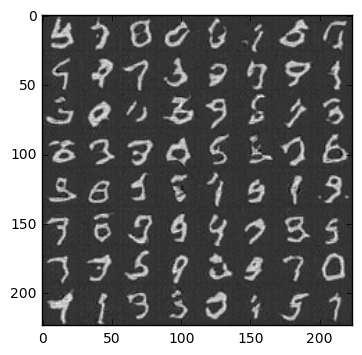

step 3420, (epoch 2/2)... discriminator loss: 2.986... generator loss: 2.275
step 3440, (epoch 2/2)... discriminator loss: 2.723... generator loss: 2.787
step 3460, (epoch 2/2)... discriminator loss: 3.636... generator loss: 3.588
step 3480, (epoch 2/2)... discriminator loss: 2.755... generator loss: 3.298
step 3500, (epoch 2/2)... discriminator loss: 3.005... generator loss: 3.538
step 3520, (epoch 2/2)... discriminator loss: 3.006... generator loss: 2.204
step 3540, (epoch 2/2)... discriminator loss: 3.183... generator loss: 4.895
step 3560, (epoch 2/2)... discriminator loss: 3.419... generator loss: 2.951
step 3580, (epoch 2/2)... discriminator loss: 3.787... generator loss: 5.527
step 3600, (epoch 2/2)... discriminator loss: 4.327... generator loss: 4.108


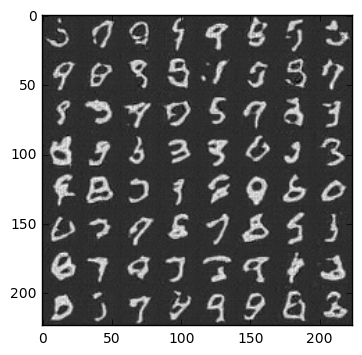

step 3620, (epoch 2/2)... discriminator loss: 3.404... generator loss: 2.551
step 3640, (epoch 2/2)... discriminator loss: 3.190... generator loss: 3.335
step 3660, (epoch 2/2)... discriminator loss: 2.751... generator loss: 2.745
step 3680, (epoch 2/2)... discriminator loss: 3.776... generator loss: 4.527
step 3700, (epoch 2/2)... discriminator loss: 3.302... generator loss: 3.840
step 3720, (epoch 2/2)... discriminator loss: 2.231... generator loss: 2.294
step 3740, (epoch 2/2)... discriminator loss: 2.586... generator loss: 3.328


In [73]:
batch_size = 32
z_dim = 100
learning_rate = 0.0006
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

step 0, (epoch 1/1)... discriminator loss: 7.173... generator loss: 0.002


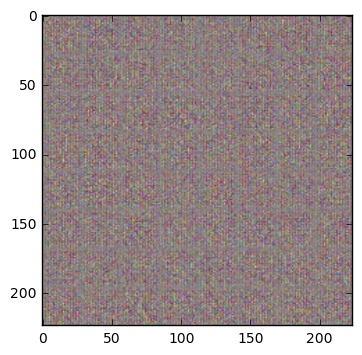

step 20, (epoch 1/1)... discriminator loss: 2.607... generator loss: 0.162
step 40, (epoch 1/1)... discriminator loss: 1.057... generator loss: 2.032
step 60, (epoch 1/1)... discriminator loss: 1.759... generator loss: 0.995
step 80, (epoch 1/1)... discriminator loss: 5.805... generator loss: 4.572
step 100, (epoch 1/1)... discriminator loss: 8.489... generator loss: 3.899
step 120, (epoch 1/1)... discriminator loss: 9.607... generator loss: 1.485
step 140, (epoch 1/1)... discriminator loss: 7.522... generator loss: 2.757
step 160, (epoch 1/1)... discriminator loss: 7.370... generator loss: 6.185
step 180, (epoch 1/1)... discriminator loss: 5.597... generator loss: 1.692
step 200, (epoch 1/1)... discriminator loss: 6.450... generator loss: 4.930


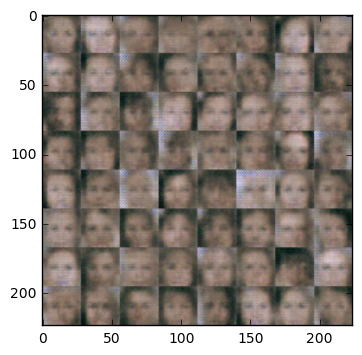

step 220, (epoch 1/1)... discriminator loss: 5.974... generator loss: 2.674
step 240, (epoch 1/1)... discriminator loss: 8.855... generator loss: 3.997
step 260, (epoch 1/1)... discriminator loss: 7.841... generator loss: 5.676
step 280, (epoch 1/1)... discriminator loss: 5.650... generator loss: 6.873
step 300, (epoch 1/1)... discriminator loss: 7.713... generator loss: 0.404
step 320, (epoch 1/1)... discriminator loss: 8.806... generator loss: 2.380
step 340, (epoch 1/1)... discriminator loss: 9.410... generator loss: 0.690
step 360, (epoch 1/1)... discriminator loss: 5.966... generator loss: 2.505
step 380, (epoch 1/1)... discriminator loss: 6.785... generator loss: 3.851
step 400, (epoch 1/1)... discriminator loss: 5.767... generator loss: 1.656


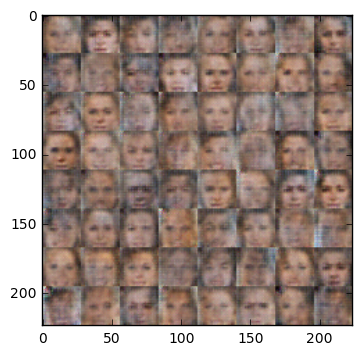

step 420, (epoch 1/1)... discriminator loss: 6.991... generator loss: 2.280
step 440, (epoch 1/1)... discriminator loss: 6.652... generator loss: 5.184
step 460, (epoch 1/1)... discriminator loss: 6.345... generator loss: 5.664
step 480, (epoch 1/1)... discriminator loss: 6.247... generator loss: 2.225
step 500, (epoch 1/1)... discriminator loss: 6.599... generator loss: 5.911
step 520, (epoch 1/1)... discriminator loss: 5.501... generator loss: 1.591
step 540, (epoch 1/1)... discriminator loss: 5.896... generator loss: 7.275
step 560, (epoch 1/1)... discriminator loss: 7.818... generator loss: 1.358
step 580, (epoch 1/1)... discriminator loss: 6.747... generator loss: 3.174
step 600, (epoch 1/1)... discriminator loss: 7.990... generator loss: 5.695


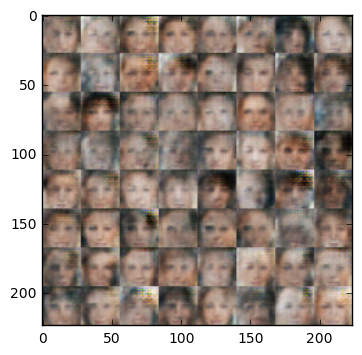

step 620, (epoch 1/1)... discriminator loss: 8.665... generator loss: 3.658
step 640, (epoch 1/1)... discriminator loss: 8.795... generator loss: 7.827
step 660, (epoch 1/1)... discriminator loss: 7.857... generator loss: 7.527
step 680, (epoch 1/1)... discriminator loss: 8.067... generator loss: 6.016
step 700, (epoch 1/1)... discriminator loss: 8.030... generator loss: 6.153
step 720, (epoch 1/1)... discriminator loss: 7.777... generator loss: 7.436
step 740, (epoch 1/1)... discriminator loss: 2.983... generator loss: 1.689
step 760, (epoch 1/1)... discriminator loss: 4.362... generator loss: 0.952
step 780, (epoch 1/1)... discriminator loss: 6.435... generator loss: 6.213
step 800, (epoch 1/1)... discriminator loss: 7.774... generator loss: 6.992


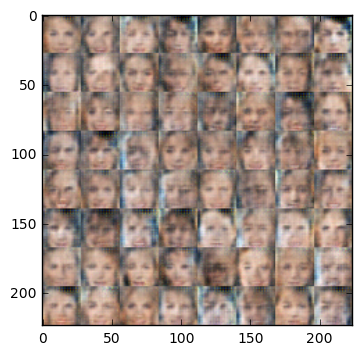

step 820, (epoch 1/1)... discriminator loss: 7.884... generator loss: 3.559
step 840, (epoch 1/1)... discriminator loss: 8.933... generator loss: 5.853
step 860, (epoch 1/1)... discriminator loss: 9.008... generator loss: 3.408
step 880, (epoch 1/1)... discriminator loss: 9.610... generator loss: 10.468
step 900, (epoch 1/1)... discriminator loss: 7.770... generator loss: 3.580
step 920, (epoch 1/1)... discriminator loss: 9.928... generator loss: 5.370
step 940, (epoch 1/1)... discriminator loss: 9.151... generator loss: 7.682
step 960, (epoch 1/1)... discriminator loss: 4.256... generator loss: 7.601
step 980, (epoch 1/1)... discriminator loss: 7.187... generator loss: 3.570
step 1000, (epoch 1/1)... discriminator loss: 8.310... generator loss: 1.412


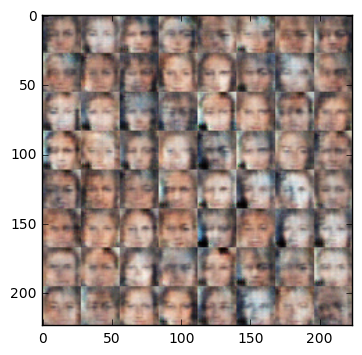

step 1020, (epoch 1/1)... discriminator loss: 10.459... generator loss: 5.343
step 1040, (epoch 1/1)... discriminator loss: 3.617... generator loss: 1.287
step 1060, (epoch 1/1)... discriminator loss: 6.363... generator loss: 0.692
step 1080, (epoch 1/1)... discriminator loss: 8.278... generator loss: 4.107
step 1100, (epoch 1/1)... discriminator loss: 8.306... generator loss: 4.959
step 1120, (epoch 1/1)... discriminator loss: 6.500... generator loss: 3.467
step 1140, (epoch 1/1)... discriminator loss: 8.297... generator loss: 3.783
step 1160, (epoch 1/1)... discriminator loss: 8.909... generator loss: 7.212
step 1180, (epoch 1/1)... discriminator loss: 5.608... generator loss: 3.300
step 1200, (epoch 1/1)... discriminator loss: 5.471... generator loss: 7.657


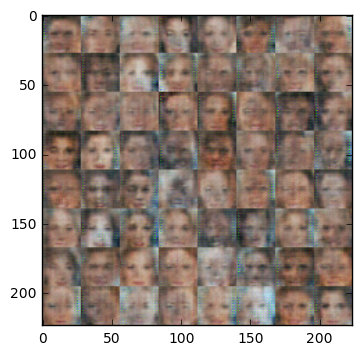

step 1220, (epoch 1/1)... discriminator loss: 6.381... generator loss: 6.484
step 1240, (epoch 1/1)... discriminator loss: 8.641... generator loss: 4.861
step 1260, (epoch 1/1)... discriminator loss: 9.032... generator loss: 9.524
step 1280, (epoch 1/1)... discriminator loss: 9.025... generator loss: 7.755
step 1300, (epoch 1/1)... discriminator loss: 9.507... generator loss: 5.488
step 1320, (epoch 1/1)... discriminator loss: 9.459... generator loss: 9.561
step 1340, (epoch 1/1)... discriminator loss: 9.650... generator loss: 5.228
step 1360, (epoch 1/1)... discriminator loss: 8.819... generator loss: 6.797
step 1380, (epoch 1/1)... discriminator loss: 8.970... generator loss: 6.879
step 1400, (epoch 1/1)... discriminator loss: 9.237... generator loss: 4.454


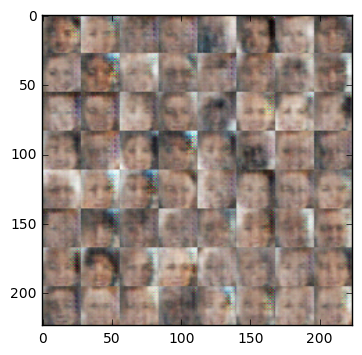

step 1420, (epoch 1/1)... discriminator loss: 8.547... generator loss: 3.267
step 1440, (epoch 1/1)... discriminator loss: 9.291... generator loss: 8.208
step 1460, (epoch 1/1)... discriminator loss: 9.505... generator loss: 2.053
step 1480, (epoch 1/1)... discriminator loss: 8.800... generator loss: 4.671
step 1500, (epoch 1/1)... discriminator loss: 7.163... generator loss: 7.982
step 1520, (epoch 1/1)... discriminator loss: 9.233... generator loss: 3.561
step 1540, (epoch 1/1)... discriminator loss: 9.447... generator loss: 5.090
step 1560, (epoch 1/1)... discriminator loss: 10.298... generator loss: 6.985
step 1580, (epoch 1/1)... discriminator loss: 8.725... generator loss: 5.177
step 1600, (epoch 1/1)... discriminator loss: 9.931... generator loss: 4.317


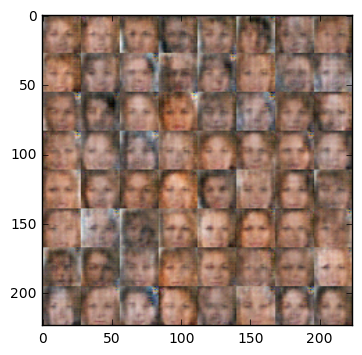

step 1620, (epoch 1/1)... discriminator loss: 4.651... generator loss: 3.438
step 1640, (epoch 1/1)... discriminator loss: 9.472... generator loss: 5.645
step 1660, (epoch 1/1)... discriminator loss: 6.127... generator loss: 0.691
step 1680, (epoch 1/1)... discriminator loss: 7.228... generator loss: 2.127
step 1700, (epoch 1/1)... discriminator loss: 8.570... generator loss: 2.099
step 1720, (epoch 1/1)... discriminator loss: 8.694... generator loss: 2.637
step 1740, (epoch 1/1)... discriminator loss: 5.924... generator loss: 0.298
step 1760, (epoch 1/1)... discriminator loss: 7.412... generator loss: 4.687
step 1780, (epoch 1/1)... discriminator loss: 8.658... generator loss: 8.038
step 1800, (epoch 1/1)... discriminator loss: 6.182... generator loss: 0.121


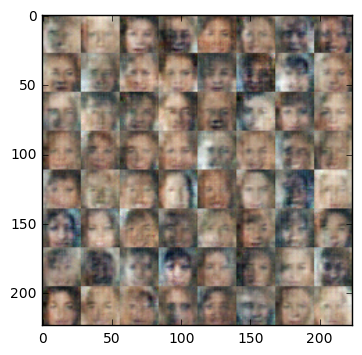

step 1820, (epoch 1/1)... discriminator loss: 6.000... generator loss: 0.979
step 1840, (epoch 1/1)... discriminator loss: 4.594... generator loss: 0.176
step 1860, (epoch 1/1)... discriminator loss: 6.624... generator loss: 1.669
step 1880, (epoch 1/1)... discriminator loss: 6.899... generator loss: 4.868
step 1900, (epoch 1/1)... discriminator loss: 8.192... generator loss: 5.922
step 1920, (epoch 1/1)... discriminator loss: 5.996... generator loss: 0.826
step 1940, (epoch 1/1)... discriminator loss: 6.125... generator loss: 3.019
step 1960, (epoch 1/1)... discriminator loss: 10.902... generator loss: 6.077
step 1980, (epoch 1/1)... discriminator loss: 6.390... generator loss: 2.113
step 2000, (epoch 1/1)... discriminator loss: 9.441... generator loss: 10.099


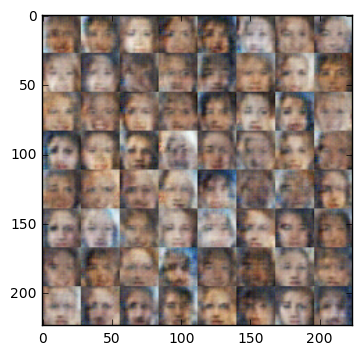

step 2020, (epoch 1/1)... discriminator loss: 7.594... generator loss: 10.826
step 2040, (epoch 1/1)... discriminator loss: 8.212... generator loss: 8.734
step 2060, (epoch 1/1)... discriminator loss: 4.840... generator loss: 6.107
step 2080, (epoch 1/1)... discriminator loss: 4.939... generator loss: 5.765
step 2100, (epoch 1/1)... discriminator loss: 6.778... generator loss: 6.687
step 2120, (epoch 1/1)... discriminator loss: 7.042... generator loss: 3.129
step 2140, (epoch 1/1)... discriminator loss: 3.850... generator loss: 1.556
step 2160, (epoch 1/1)... discriminator loss: 6.317... generator loss: 4.036
step 2180, (epoch 1/1)... discriminator loss: 7.221... generator loss: 3.692
step 2200, (epoch 1/1)... discriminator loss: 9.918... generator loss: 5.114


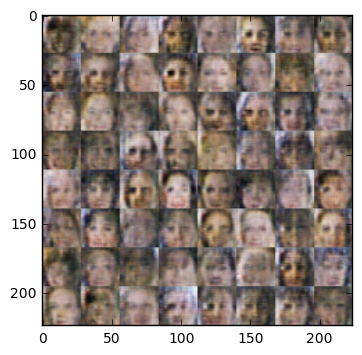

step 2220, (epoch 1/1)... discriminator loss: 9.397... generator loss: 4.411
step 2240, (epoch 1/1)... discriminator loss: 9.602... generator loss: 3.496
step 2260, (epoch 1/1)... discriminator loss: 9.994... generator loss: 7.343
step 2280, (epoch 1/1)... discriminator loss: 10.166... generator loss: 9.323
step 2300, (epoch 1/1)... discriminator loss: 10.809... generator loss: 4.737
step 2320, (epoch 1/1)... discriminator loss: 4.058... generator loss: 3.259
step 2340, (epoch 1/1)... discriminator loss: 6.454... generator loss: 5.087
step 2360, (epoch 1/1)... discriminator loss: 3.536... generator loss: 6.587
step 2380, (epoch 1/1)... discriminator loss: 4.770... generator loss: 2.225
step 2400, (epoch 1/1)... discriminator loss: 6.849... generator loss: 4.166


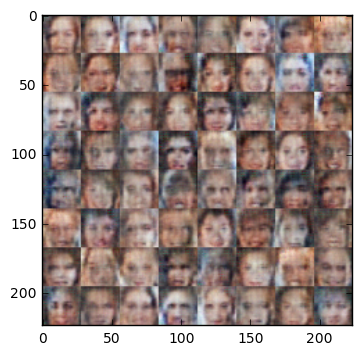

step 2420, (epoch 1/1)... discriminator loss: 8.716... generator loss: 7.644
step 2440, (epoch 1/1)... discriminator loss: 6.306... generator loss: 1.266
step 2460, (epoch 1/1)... discriminator loss: 6.220... generator loss: 5.439
step 2480, (epoch 1/1)... discriminator loss: 7.290... generator loss: 0.979
step 2500, (epoch 1/1)... discriminator loss: 8.073... generator loss: 9.513
step 2520, (epoch 1/1)... discriminator loss: 8.250... generator loss: 10.679
step 2540, (epoch 1/1)... discriminator loss: 9.046... generator loss: 4.913
step 2560, (epoch 1/1)... discriminator loss: 6.017... generator loss: 1.261
step 2580, (epoch 1/1)... discriminator loss: 7.497... generator loss: 1.492
step 2600, (epoch 1/1)... discriminator loss: 7.815... generator loss: 4.311


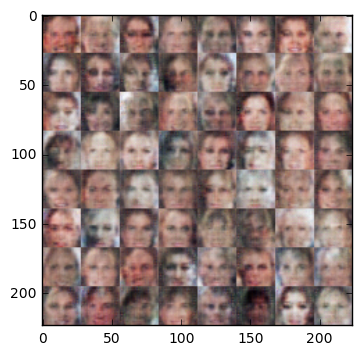

step 2620, (epoch 1/1)... discriminator loss: 9.096... generator loss: 5.207
step 2640, (epoch 1/1)... discriminator loss: 9.458... generator loss: 7.788
step 2660, (epoch 1/1)... discriminator loss: 9.285... generator loss: 7.695
step 2680, (epoch 1/1)... discriminator loss: 9.752... generator loss: 10.017
step 2700, (epoch 1/1)... discriminator loss: 9.992... generator loss: 5.402
step 2720, (epoch 1/1)... discriminator loss: 9.549... generator loss: 5.367
step 2740, (epoch 1/1)... discriminator loss: 11.129... generator loss: 5.744
step 2760, (epoch 1/1)... discriminator loss: 6.286... generator loss: 2.045
step 2780, (epoch 1/1)... discriminator loss: 5.991... generator loss: 7.010
step 2800, (epoch 1/1)... discriminator loss: 6.463... generator loss: 4.088


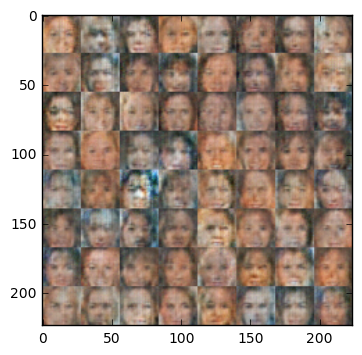

step 2820, (epoch 1/1)... discriminator loss: 6.869... generator loss: 2.196
step 2840, (epoch 1/1)... discriminator loss: 5.185... generator loss: 1.210
step 2860, (epoch 1/1)... discriminator loss: 4.746... generator loss: 0.665
step 2880, (epoch 1/1)... discriminator loss: 5.610... generator loss: 0.805
step 2900, (epoch 1/1)... discriminator loss: 7.513... generator loss: 3.936
step 2920, (epoch 1/1)... discriminator loss: 7.487... generator loss: 3.291
step 2940, (epoch 1/1)... discriminator loss: 7.900... generator loss: 6.114
step 2960, (epoch 1/1)... discriminator loss: 6.025... generator loss: 1.417
step 2980, (epoch 1/1)... discriminator loss: 7.267... generator loss: 0.300
step 3000, (epoch 1/1)... discriminator loss: 5.920... generator loss: 4.038


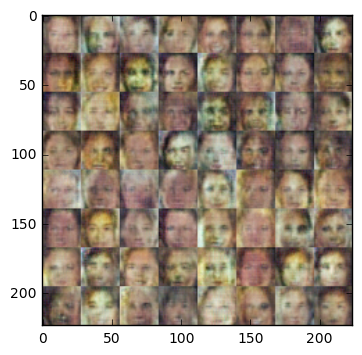

step 3020, (epoch 1/1)... discriminator loss: 6.375... generator loss: 2.827
step 3040, (epoch 1/1)... discriminator loss: 6.662... generator loss: 4.070
step 3060, (epoch 1/1)... discriminator loss: 6.593... generator loss: 4.760
step 3080, (epoch 1/1)... discriminator loss: 6.214... generator loss: 1.670
step 3100, (epoch 1/1)... discriminator loss: 5.704... generator loss: 3.271
step 3120, (epoch 1/1)... discriminator loss: 6.753... generator loss: 1.993
step 3140, (epoch 1/1)... discriminator loss: 7.768... generator loss: 3.584
step 3160, (epoch 1/1)... discriminator loss: 10.454... generator loss: 4.833
step 3180, (epoch 1/1)... discriminator loss: 7.187... generator loss: 7.936
step 3200, (epoch 1/1)... discriminator loss: 6.614... generator loss: 3.939


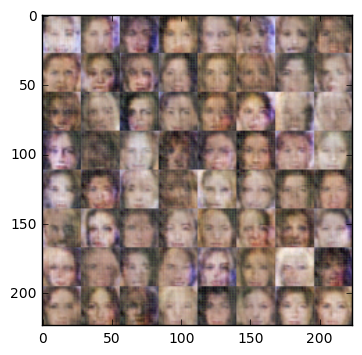

step 3220, (epoch 1/1)... discriminator loss: 8.980... generator loss: 5.075
step 3240, (epoch 1/1)... discriminator loss: 6.502... generator loss: 2.744
step 3260, (epoch 1/1)... discriminator loss: 6.713... generator loss: 3.119
step 3280, (epoch 1/1)... discriminator loss: 7.121... generator loss: 0.804
step 3300, (epoch 1/1)... discriminator loss: 7.322... generator loss: 3.718
step 3320, (epoch 1/1)... discriminator loss: 5.972... generator loss: 0.829
step 3340, (epoch 1/1)... discriminator loss: 7.488... generator loss: 6.018
step 3360, (epoch 1/1)... discriminator loss: 6.025... generator loss: 2.281
step 3380, (epoch 1/1)... discriminator loss: 6.485... generator loss: 2.323
step 3400, (epoch 1/1)... discriminator loss: 7.135... generator loss: 2.576


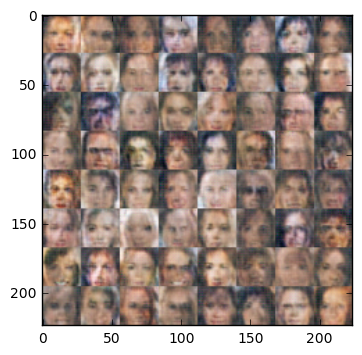

step 3420, (epoch 1/1)... discriminator loss: 7.585... generator loss: 3.366
step 3440, (epoch 1/1)... discriminator loss: 4.873... generator loss: 2.259
step 3460, (epoch 1/1)... discriminator loss: 5.446... generator loss: 0.942
step 3480, (epoch 1/1)... discriminator loss: 4.636... generator loss: 1.589
step 3500, (epoch 1/1)... discriminator loss: 6.227... generator loss: 6.037
step 3520, (epoch 1/1)... discriminator loss: 5.709... generator loss: 1.481
step 3540, (epoch 1/1)... discriminator loss: 6.086... generator loss: 5.767
step 3560, (epoch 1/1)... discriminator loss: 6.671... generator loss: 2.724
step 3580, (epoch 1/1)... discriminator loss: 8.302... generator loss: 1.359
step 3600, (epoch 1/1)... discriminator loss: 7.999... generator loss: 5.366


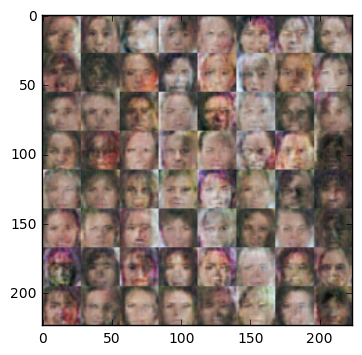

step 3620, (epoch 1/1)... discriminator loss: 6.566... generator loss: 2.567
step 3640, (epoch 1/1)... discriminator loss: 8.487... generator loss: 3.502
step 3660, (epoch 1/1)... discriminator loss: 5.976... generator loss: 0.843
step 3680, (epoch 1/1)... discriminator loss: 6.675... generator loss: 5.233
step 3700, (epoch 1/1)... discriminator loss: 6.771... generator loss: 5.087
step 3720, (epoch 1/1)... discriminator loss: 6.426... generator loss: 1.304
step 3740, (epoch 1/1)... discriminator loss: 5.899... generator loss: 1.208
step 3760, (epoch 1/1)... discriminator loss: 6.743... generator loss: 1.938
step 3780, (epoch 1/1)... discriminator loss: 7.892... generator loss: 4.231
step 3800, (epoch 1/1)... discriminator loss: 6.275... generator loss: 0.970


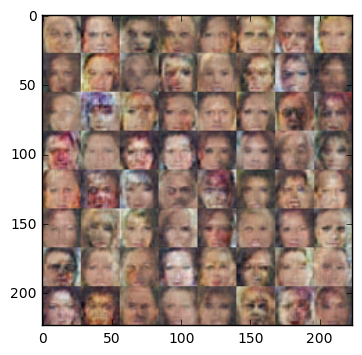

step 3820, (epoch 1/1)... discriminator loss: 6.982... generator loss: 2.465
step 3840, (epoch 1/1)... discriminator loss: 8.056... generator loss: 0.562
step 3860, (epoch 1/1)... discriminator loss: 8.397... generator loss: 6.419
step 3880, (epoch 1/1)... discriminator loss: 7.006... generator loss: 0.746
step 3900, (epoch 1/1)... discriminator loss: 5.943... generator loss: 3.660
step 3920, (epoch 1/1)... discriminator loss: 8.651... generator loss: 5.034
step 3940, (epoch 1/1)... discriminator loss: 6.571... generator loss: 3.573
step 3960, (epoch 1/1)... discriminator loss: 7.624... generator loss: 1.799
step 3980, (epoch 1/1)... discriminator loss: 7.589... generator loss: 6.042
step 4000, (epoch 1/1)... discriminator loss: 7.335... generator loss: 2.808


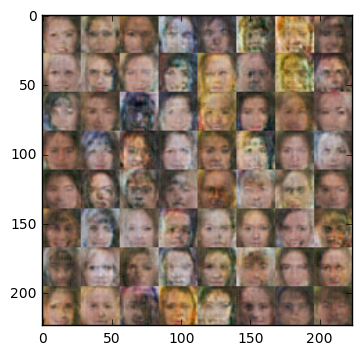

step 4020, (epoch 1/1)... discriminator loss: 6.839... generator loss: 0.266
step 4040, (epoch 1/1)... discriminator loss: 5.777... generator loss: 5.192
step 4060, (epoch 1/1)... discriminator loss: 8.373... generator loss: 7.604
step 4080, (epoch 1/1)... discriminator loss: 7.104... generator loss: 2.059
step 4100, (epoch 1/1)... discriminator loss: 7.244... generator loss: 5.938
step 4120, (epoch 1/1)... discriminator loss: 8.301... generator loss: 1.474
step 4140, (epoch 1/1)... discriminator loss: 7.431... generator loss: 2.582
step 4160, (epoch 1/1)... discriminator loss: 5.971... generator loss: 0.712
step 4180, (epoch 1/1)... discriminator loss: 6.768... generator loss: 2.122
step 4200, (epoch 1/1)... discriminator loss: 6.049... generator loss: 1.619


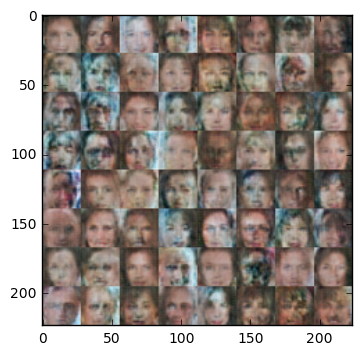

step 4220, (epoch 1/1)... discriminator loss: 7.289... generator loss: 4.069
step 4240, (epoch 1/1)... discriminator loss: 7.144... generator loss: 4.822
step 4260, (epoch 1/1)... discriminator loss: 7.054... generator loss: 0.669
step 4280, (epoch 1/1)... discriminator loss: 6.461... generator loss: 1.572
step 4300, (epoch 1/1)... discriminator loss: 7.932... generator loss: 8.395
step 4320, (epoch 1/1)... discriminator loss: 6.393... generator loss: 3.649
step 4340, (epoch 1/1)... discriminator loss: 9.254... generator loss: 0.339
step 4360, (epoch 1/1)... discriminator loss: 8.160... generator loss: 0.177
step 4380, (epoch 1/1)... discriminator loss: 7.008... generator loss: 5.694
step 4400, (epoch 1/1)... discriminator loss: 6.511... generator loss: 1.971


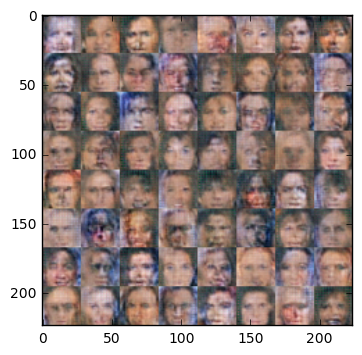

step 4420, (epoch 1/1)... discriminator loss: 5.876... generator loss: 0.579
step 4440, (epoch 1/1)... discriminator loss: 5.836... generator loss: 3.428
step 4460, (epoch 1/1)... discriminator loss: 5.954... generator loss: 3.458
step 4480, (epoch 1/1)... discriminator loss: 4.563... generator loss: 1.846
step 4500, (epoch 1/1)... discriminator loss: 6.766... generator loss: 3.571
step 4520, (epoch 1/1)... discriminator loss: 6.042... generator loss: 5.257
step 4540, (epoch 1/1)... discriminator loss: 6.928... generator loss: 1.520
step 4560, (epoch 1/1)... discriminator loss: 7.158... generator loss: 1.930
step 4580, (epoch 1/1)... discriminator loss: 5.456... generator loss: 1.385
step 4600, (epoch 1/1)... discriminator loss: 5.815... generator loss: 1.183


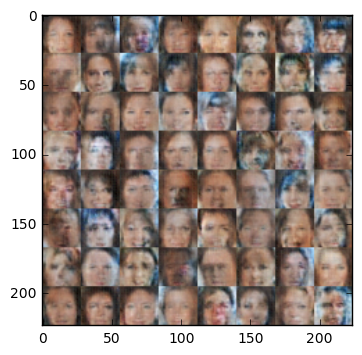

step 4620, (epoch 1/1)... discriminator loss: 6.317... generator loss: 0.625
step 4640, (epoch 1/1)... discriminator loss: 6.010... generator loss: 2.797
step 4660, (epoch 1/1)... discriminator loss: 5.964... generator loss: 3.693
step 4680, (epoch 1/1)... discriminator loss: 5.870... generator loss: 2.580
step 4700, (epoch 1/1)... discriminator loss: 6.171... generator loss: 4.349
step 4720, (epoch 1/1)... discriminator loss: 7.252... generator loss: 1.319
step 4740, (epoch 1/1)... discriminator loss: 6.581... generator loss: 0.491
step 4760, (epoch 1/1)... discriminator loss: 5.961... generator loss: 3.648
step 4780, (epoch 1/1)... discriminator loss: 5.316... generator loss: 1.267
step 4800, (epoch 1/1)... discriminator loss: 4.731... generator loss: 0.491


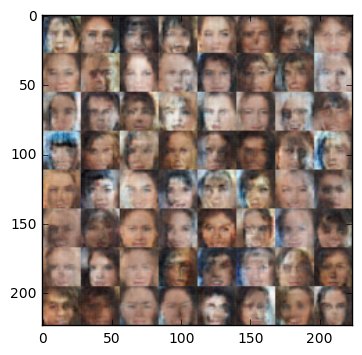

step 4820, (epoch 1/1)... discriminator loss: 5.915... generator loss: 0.955
step 4840, (epoch 1/1)... discriminator loss: 6.061... generator loss: 3.606
step 4860, (epoch 1/1)... discriminator loss: 9.855... generator loss: 2.354
step 4880, (epoch 1/1)... discriminator loss: 5.389... generator loss: 1.040
step 4900, (epoch 1/1)... discriminator loss: 5.217... generator loss: 2.595
step 4920, (epoch 1/1)... discriminator loss: 7.537... generator loss: 0.314
step 4940, (epoch 1/1)... discriminator loss: 6.807... generator loss: 1.503
step 4960, (epoch 1/1)... discriminator loss: 6.437... generator loss: 0.751
step 4980, (epoch 1/1)... discriminator loss: 5.808... generator loss: 0.756
step 5000, (epoch 1/1)... discriminator loss: 6.175... generator loss: 2.227


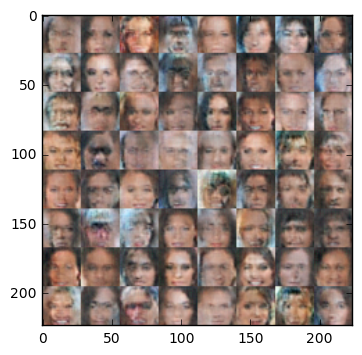

step 5020, (epoch 1/1)... discriminator loss: 7.116... generator loss: 3.633
step 5040, (epoch 1/1)... discriminator loss: 6.114... generator loss: 5.216
step 5060, (epoch 1/1)... discriminator loss: 6.484... generator loss: 0.806
step 5080, (epoch 1/1)... discriminator loss: 6.615... generator loss: 6.963
step 5100, (epoch 1/1)... discriminator loss: 6.845... generator loss: 1.904
step 5120, (epoch 1/1)... discriminator loss: 4.953... generator loss: 3.117
step 5140, (epoch 1/1)... discriminator loss: 6.570... generator loss: 3.170
step 5160, (epoch 1/1)... discriminator loss: 8.695... generator loss: 1.592
step 5180, (epoch 1/1)... discriminator loss: 6.267... generator loss: 2.921
step 5200, (epoch 1/1)... discriminator loss: 5.472... generator loss: 4.054


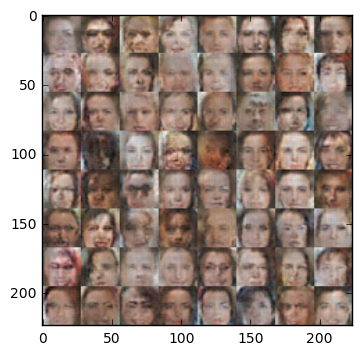

step 5220, (epoch 1/1)... discriminator loss: 5.765... generator loss: 0.669
step 5240, (epoch 1/1)... discriminator loss: 4.905... generator loss: 1.910
step 5260, (epoch 1/1)... discriminator loss: 6.488... generator loss: 1.556
step 5280, (epoch 1/1)... discriminator loss: 5.599... generator loss: 1.529
step 5300, (epoch 1/1)... discriminator loss: 6.122... generator loss: 0.737
step 5320, (epoch 1/1)... discriminator loss: 7.581... generator loss: 2.789
step 5340, (epoch 1/1)... discriminator loss: 6.542... generator loss: 1.049
step 5360, (epoch 1/1)... discriminator loss: 6.088... generator loss: 2.932
step 5380, (epoch 1/1)... discriminator loss: 7.484... generator loss: 1.058
step 5400, (epoch 1/1)... discriminator loss: 7.957... generator loss: 3.144


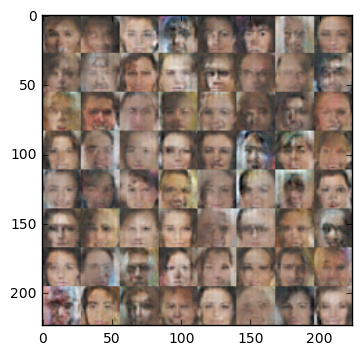

step 5420, (epoch 1/1)... discriminator loss: 7.697... generator loss: 3.218
step 5440, (epoch 1/1)... discriminator loss: 5.502... generator loss: 1.569
step 5460, (epoch 1/1)... discriminator loss: 7.345... generator loss: 1.805
step 5480, (epoch 1/1)... discriminator loss: 4.266... generator loss: 2.246
step 5500, (epoch 1/1)... discriminator loss: 6.022... generator loss: 2.316
step 5520, (epoch 1/1)... discriminator loss: 6.110... generator loss: 3.013
step 5540, (epoch 1/1)... discriminator loss: 5.995... generator loss: 0.931
step 5560, (epoch 1/1)... discriminator loss: 6.375... generator loss: 0.752
step 5580, (epoch 1/1)... discriminator loss: 6.452... generator loss: 3.375
step 5600, (epoch 1/1)... discriminator loss: 6.060... generator loss: 2.141


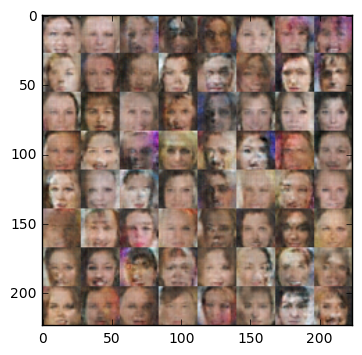

step 5620, (epoch 1/1)... discriminator loss: 5.587... generator loss: 3.845
step 5640, (epoch 1/1)... discriminator loss: 5.611... generator loss: 3.927
step 5660, (epoch 1/1)... discriminator loss: 7.245... generator loss: 3.696
step 5680, (epoch 1/1)... discriminator loss: 4.983... generator loss: 3.795
step 5700, (epoch 1/1)... discriminator loss: 5.887... generator loss: 3.629
step 5720, (epoch 1/1)... discriminator loss: 6.156... generator loss: 1.399
step 5740, (epoch 1/1)... discriminator loss: 4.448... generator loss: 0.930
step 5760, (epoch 1/1)... discriminator loss: 6.300... generator loss: 0.918
step 5780, (epoch 1/1)... discriminator loss: 6.520... generator loss: 3.187
step 5800, (epoch 1/1)... discriminator loss: 5.363... generator loss: 0.711


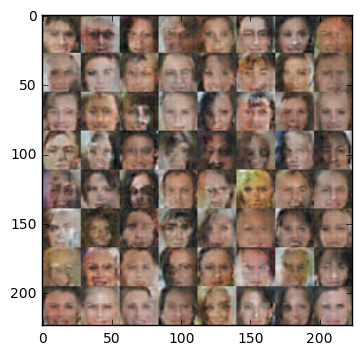

step 5820, (epoch 1/1)... discriminator loss: 6.310... generator loss: 3.430
step 5840, (epoch 1/1)... discriminator loss: 5.119... generator loss: 0.371
step 5860, (epoch 1/1)... discriminator loss: 7.265... generator loss: 3.996
step 5880, (epoch 1/1)... discriminator loss: 4.954... generator loss: 0.470
step 5900, (epoch 1/1)... discriminator loss: 4.933... generator loss: 3.267
step 5920, (epoch 1/1)... discriminator loss: 6.749... generator loss: 4.221
step 5940, (epoch 1/1)... discriminator loss: 6.368... generator loss: 4.401
step 5960, (epoch 1/1)... discriminator loss: 5.244... generator loss: 0.625
step 5980, (epoch 1/1)... discriminator loss: 5.372... generator loss: 0.185
step 6000, (epoch 1/1)... discriminator loss: 4.070... generator loss: 3.650


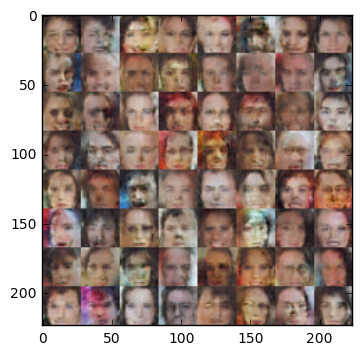

step 6020, (epoch 1/1)... discriminator loss: 6.094... generator loss: 0.831
step 6040, (epoch 1/1)... discriminator loss: 6.565... generator loss: 0.318
step 6060, (epoch 1/1)... discriminator loss: 6.482... generator loss: 3.759
step 6080, (epoch 1/1)... discriminator loss: 6.885... generator loss: 0.712
step 6100, (epoch 1/1)... discriminator loss: 6.280... generator loss: 1.384
step 6120, (epoch 1/1)... discriminator loss: 5.606... generator loss: 1.951
step 6140, (epoch 1/1)... discriminator loss: 5.902... generator loss: 2.856
step 6160, (epoch 1/1)... discriminator loss: 5.159... generator loss: 1.101
step 6180, (epoch 1/1)... discriminator loss: 5.397... generator loss: 0.427
step 6200, (epoch 1/1)... discriminator loss: 5.908... generator loss: 2.066


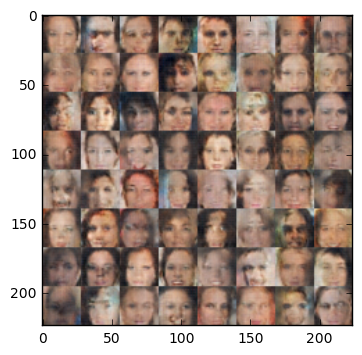

step 6220, (epoch 1/1)... discriminator loss: 5.616... generator loss: 1.117
step 6240, (epoch 1/1)... discriminator loss: 5.492... generator loss: 0.667
step 6260, (epoch 1/1)... discriminator loss: 5.663... generator loss: 0.970
step 6280, (epoch 1/1)... discriminator loss: 5.521... generator loss: 2.543
step 6300, (epoch 1/1)... discriminator loss: 5.552... generator loss: 4.910
step 6320, (epoch 1/1)... discriminator loss: 6.989... generator loss: 3.986


In [74]:
batch_size = 32
z_dim = 100
learning_rate = 0.0006
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.